# 予測結果・周期性・ラベルを一度にプロットする

In [1]:
import sys, os
sys.path.append(os.pardir)

In [2]:
from pathlib import Path
import numpy as np
import polars as pl
import os
from hydra import initialize, compose

with initialize(config_path="../run/conf", version_base=None):
    cfg = compose("cv_train", overrides=["exp_name=exp011"])

In [3]:
# series の読み込み
train_df = pl.read_parquet(Path(cfg.dir.data_dir) / "train_series.parquet")
train_df = train_df.with_columns(
            pl.col("timestamp").str.to_datetime("%Y-%m-%dT%H:%M:%S%z")
        )
valid_df = train_df.filter(pl.col("series_id").is_in(cfg.fold_0.valid_series_ids))


event_df = pl.read_csv(Path(cfg.dir.data_dir) / "train_events.csv").drop_nulls()
event_df = event_df.with_columns(
    pl.col("timestamp").str.to_datetime("%Y-%m-%dT%H:%M:%S%z")
)
valid_event_df = event_df.filter(pl.col("series_id").is_in(cfg.fold_0.valid_series_ids))

In [4]:
# 予測結果の読み込み
exp_dir = Path(os.path.join(cfg.dir.cv_model_dir, cfg.exp_name, "cv"))
keys = np.load(exp_dir / "keys_fold0.npy")
labels = np.load(exp_dir / "labels_fold0.npy")
preds = np.load(exp_dir / "preds_fold0.npy")
preds = preds[:, :, [1, 2]]

In [5]:
from src.utils.post_process import post_process_for_seg

find_peaks_df = post_process_for_seg(
                keys=keys,
                preds=preds,
                score_th=0.0038536733146294715,
                distance=80,
).to_pandas()

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [6]:
val_series = valid_df.to_pandas()
val_events = valid_event_df.to_pandas()

## vis

In [11]:

import matplotlib.pyplot as plt
import seaborn as sns

from src.utils.periodicity import predict_periodicity

def plot_series_prob_with_events(series_id, train_series, train_events, pred_events, pred_linewidth=0.5):
    # Filter the DataFrame based on the series_id
    sample_serie = train_series[train_series["series_id"] == series_id].reset_index(drop=True)
    seq = sample_serie['enmo'].to_numpy()
    periodicity = predict_periodicity(seq, downsample_rate=15, split_hour=4)

    # Filter event data based on the series_id
    sample_events = train_events[train_events["series_id"] == series_id]
    sample_time_pairs = sample_events.groupby('night')['timestamp'].apply(lambda x: tuple(x.head(2)))

    # Filter event data based on the series_id
    sample_pred_events = pred_events[pred_events["series_id"] == series_id]
    sample_onset = sample_pred_events.loc[sample_pred_events["event"] == "onset"].reset_index(drop=True)
    sample_pred_onset_id = sample_onset["step"].dropna()
    sample_wakeup = sample_pred_events.loc[sample_pred_events["event"] == "wakeup"].reset_index(drop=True)
    sample_pred_wakeup_id = sample_wakeup["step"].dropna()

    # Helper function to plot data and events
    def plot_data_and_events(data, ylabel):
        plt.figure(figsize=(20, 5))
        plt.plot(sample_serie["timestamp"], sample_serie[data], label=data, linewidth=1)    
        plt.plot(sample_serie['timestamp'], periodicity, label='periodicity', linewidth=1)

        for x in sample_time_pairs:
            if len(x)==2:
                l, r = x
            if (l is not None) and (r is not None):
                plt.axvspan(l, r, color="gray", alpha=0.4)

        for i, onset_id in enumerate(sample_pred_onset_id):
            if onset_id < len(sample_serie):
                plt.axvline(x=sample_serie['timestamp'].at[onset_id], color="m", linestyle="--", label="onset", linewidth=sample_onset['score'].at[i])

        for i, wakeup_id in enumerate(sample_pred_wakeup_id):
            if wakeup_id < len(sample_serie):
                plt.axvline(x=sample_serie['timestamp'].at[wakeup_id], color="c", linestyle="--", label="wakeup", linewidth=sample_wakeup['score'].at[i])

        handles, labels = plt.gca().get_legend_handles_labels()
        new_labels, new_handles = [], []
        for handle, label in zip(handles, labels):
            if label not in new_labels:
                new_handles.append(handle)
                new_labels.append(label)

        plt.legend(new_handles, new_labels)
        plt.xlabel("Timestamp")
        plt.ylabel(ylabel)
        plt.title(f"{ylabel} over Time with Event Flags - " + series_id)
        plt.show()

    # Plot enmo and anglez
    plot_data_and_events("enmo", "ENMO Value")
    #plot_data_and_events("anglez", "anglez Value")


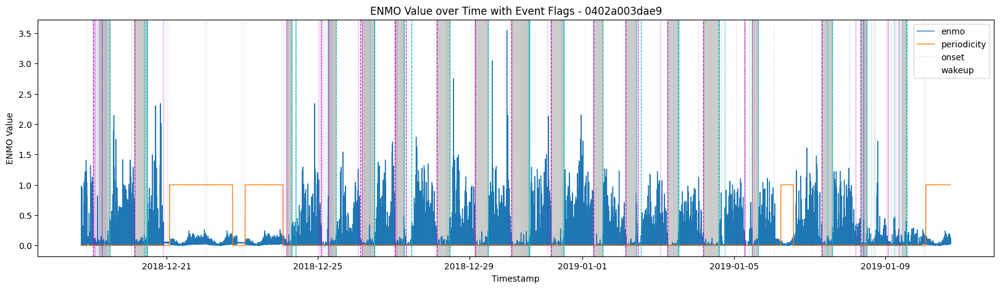

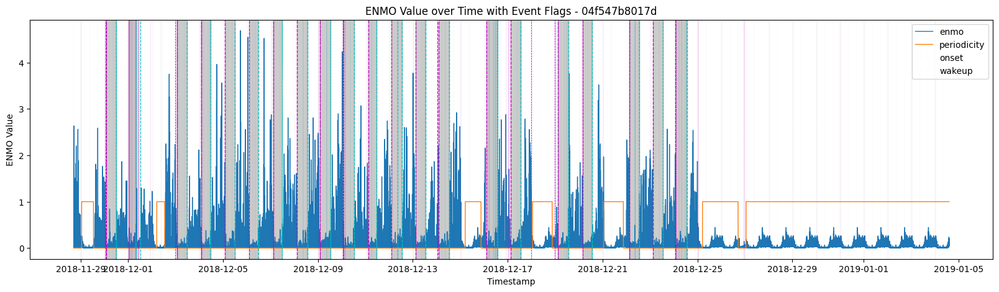

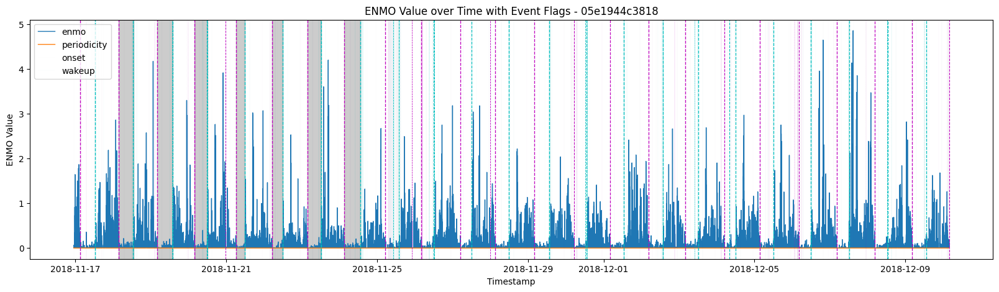

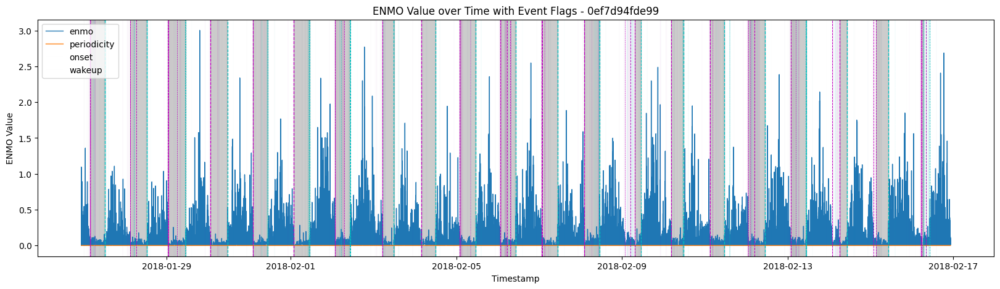

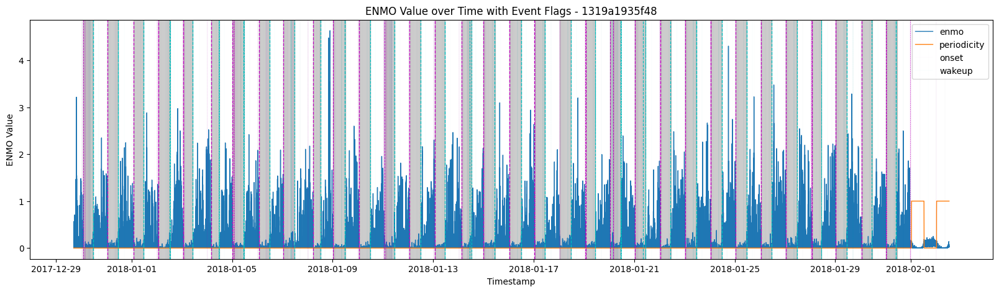

...

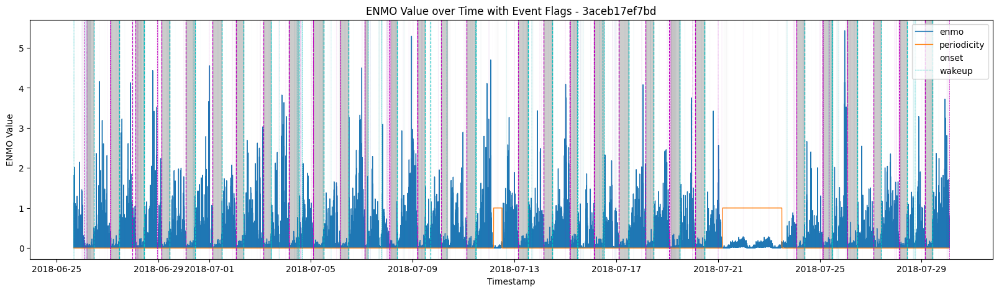

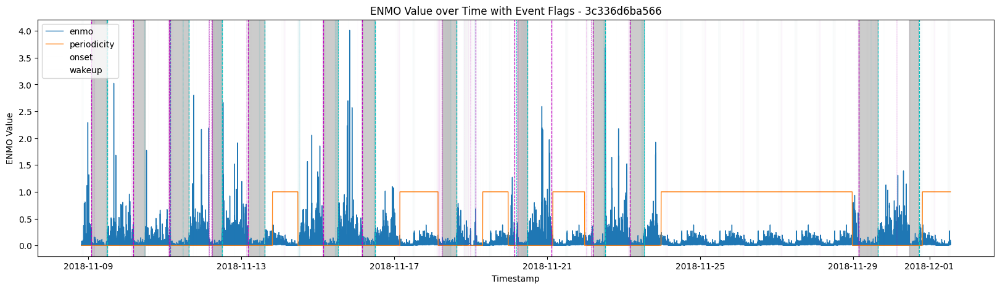

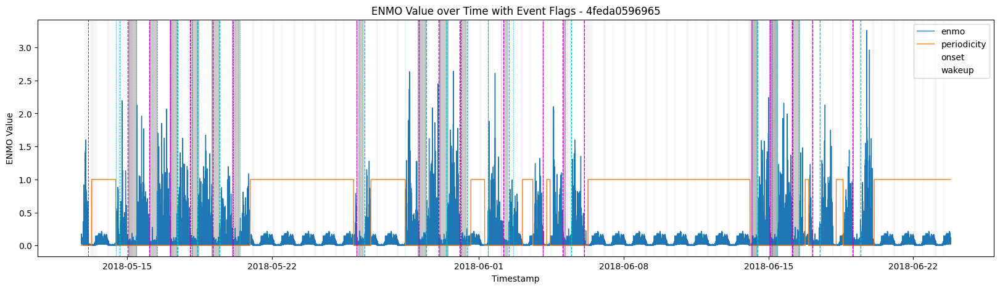

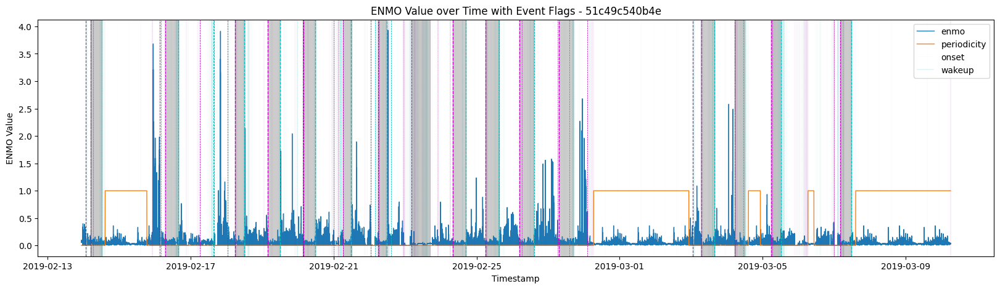

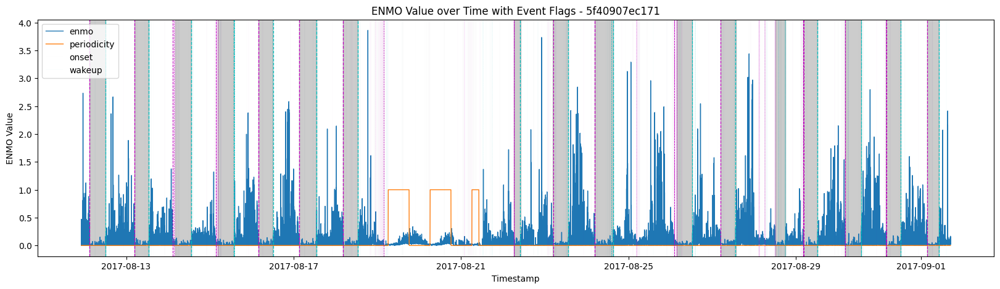

In [12]:
for series_id in val_events['series_id'].unique()[:20]:
    plot_series_prob_with_events(series_id, val_series, val_events, find_peaks_df)

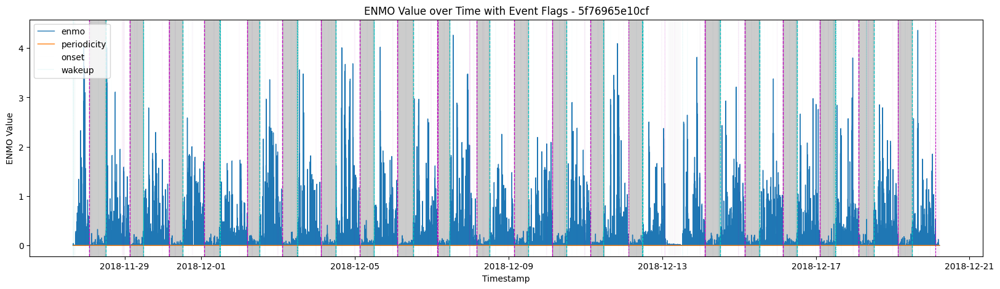

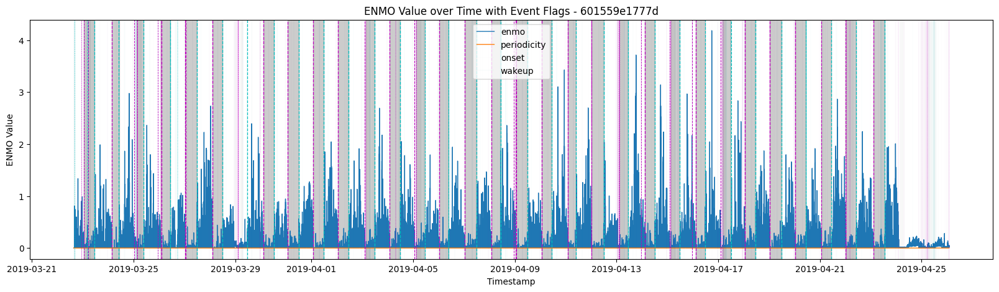

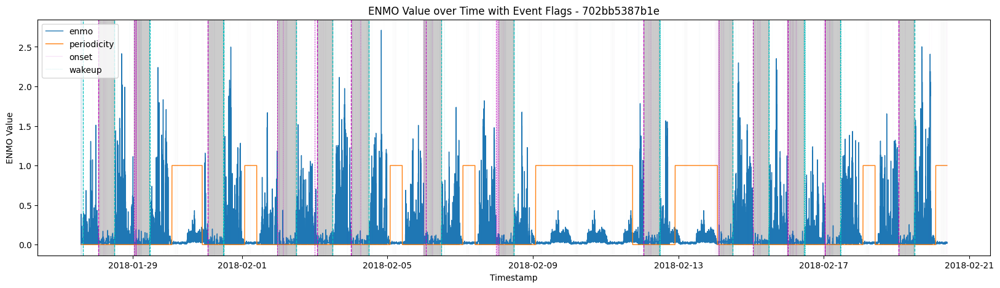

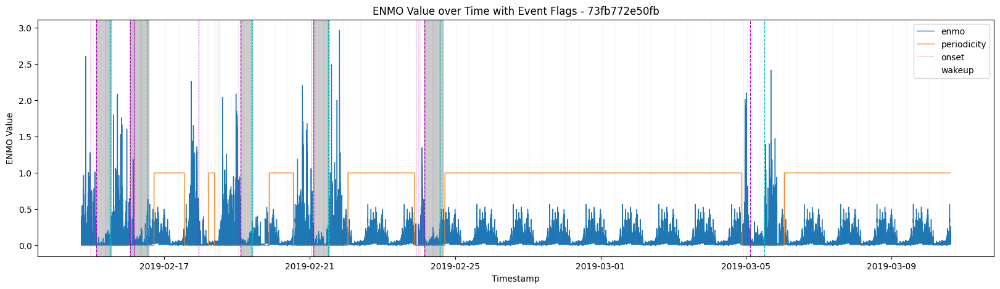

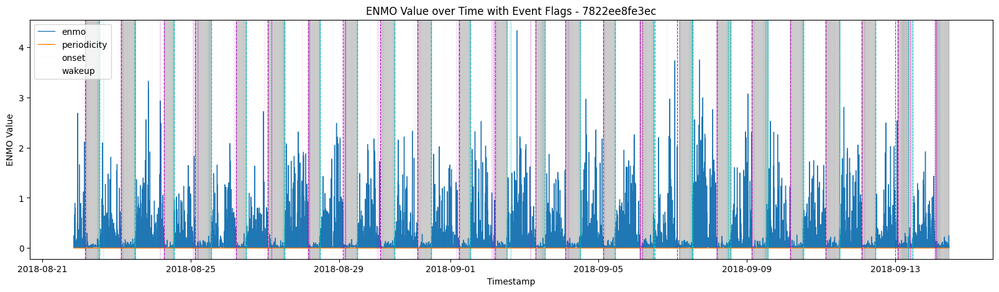

...

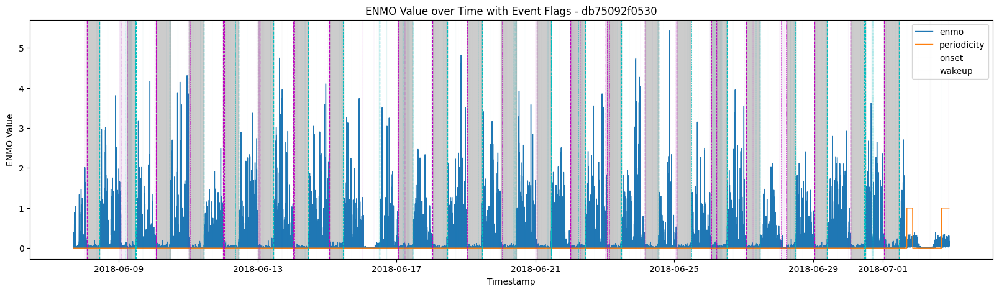

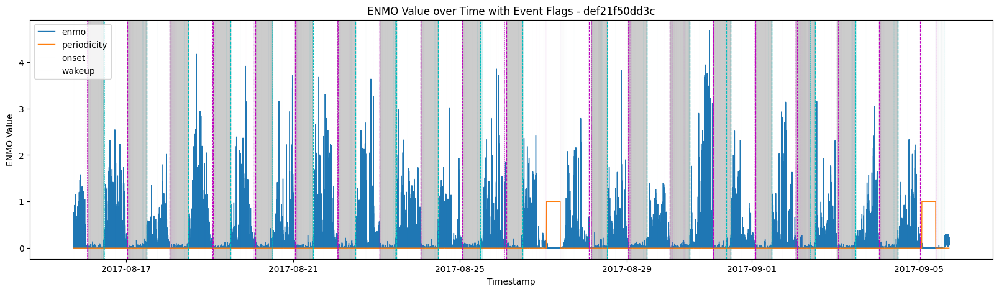

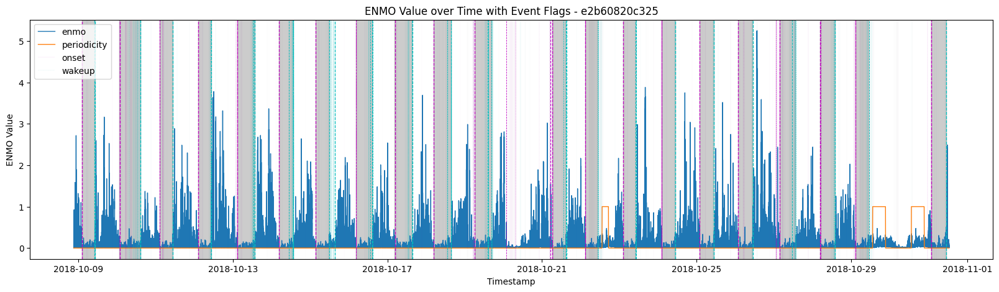

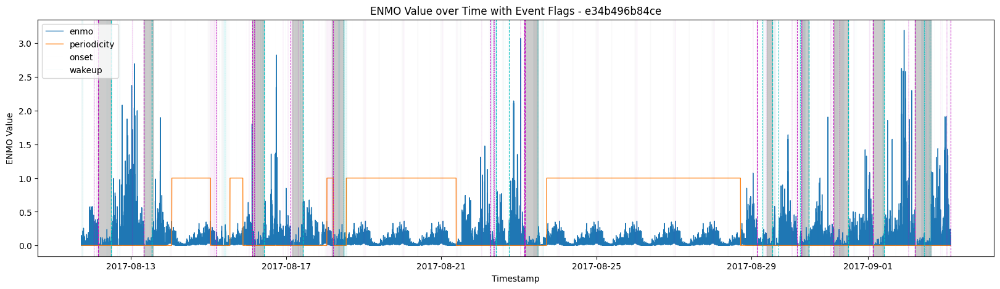

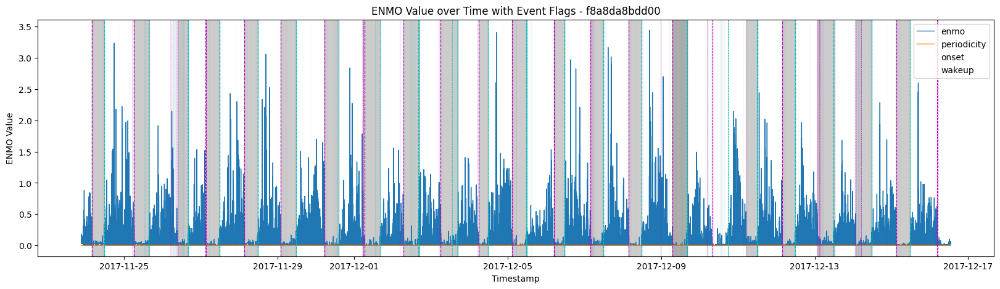

In [13]:
for series_id in val_events['series_id'].unique()[20:]:
    plot_series_prob_with_events(series_id, val_series, val_events, find_peaks_df)

05e1944c3818


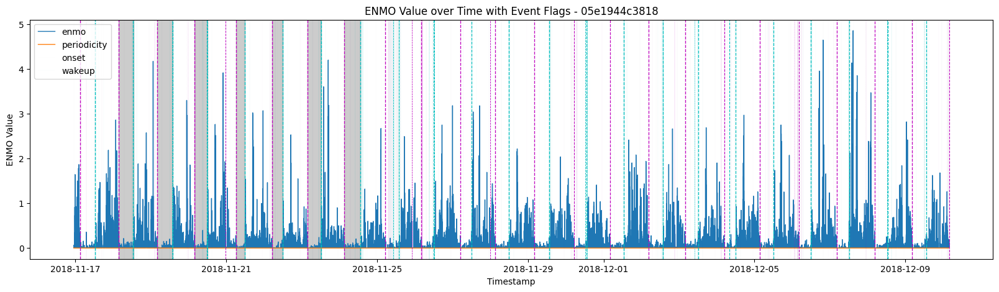

13b4d6a01d27


/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


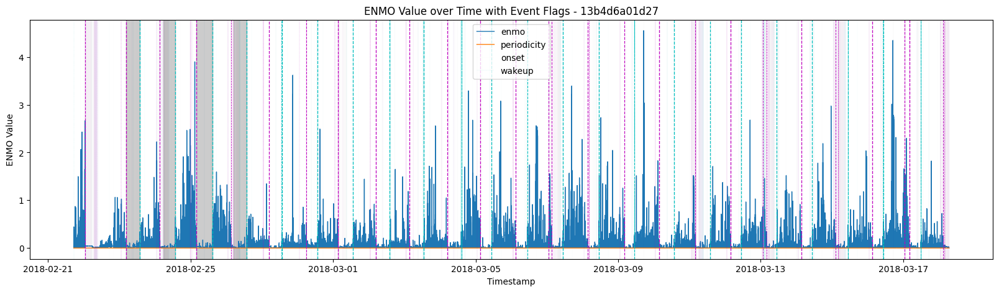

a596ad0b82aa


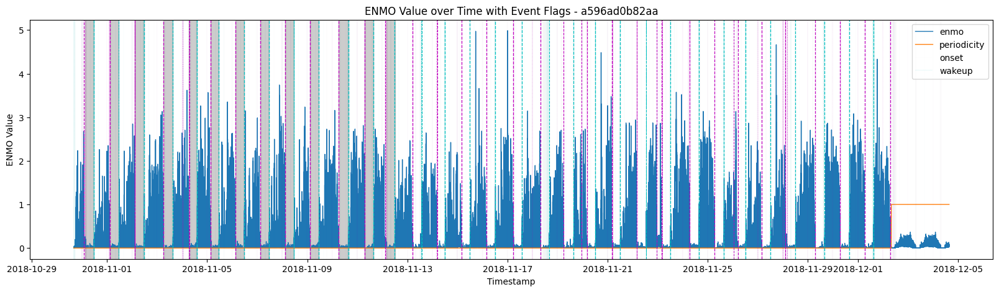

In [15]:
# 周期性が無いのに欠損しているのが顕著なもの
for series_id in np.array(val_events['series_id'].unique())[[2,5,36]]:
    print(series_id)
    plot_series_prob_with_events(series_id, val_series, val_events, find_peaks_df)